In [3]:
import os

import matplotlib.pyplot as plt
import numpy as np
import torch
from dotenv import load_dotenv
from hydra import compose
from hydra.core.global_hydra import GlobalHydra
from hydra.initialize import initialize_config_dir
from hydra.utils import instantiate

load_dotenv()
# Define the relative path to your config directory
config_dir_relative = "../../src/conf"
# Create an absolute path from the current working directory
config_dir_absolute = os.path.join(os.getcwd(), config_dir_relative)
GlobalHydra.instance().clear()

embed_fp = f"+paths.embed_fp={os.environ["GZ10_EMBEDDINGS"]}"
ckpt_fp = f"+lightning_loader.ckpt_path={os.environ["GZ10_FLOW_MODEL"]}"

with initialize_config_dir(config_dir=config_dir_absolute, version_base=None):
    cfg = compose(
        config_name="experiment/galaxy10_Flow/fm_embed",
        overrides=["++seed=42", embed_fp, ckpt_fp],
    )

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
raw_dataloader = instantiate(cfg.data.loader)

raw_dataloader.setup()

lightning_loader = instantiate(cfg.lightning_loader)
lightning_loader.to(device)

batches = {
    "X": torch.tensor([], device=device),
    "label": torch.tensor([], device=device),
    "catalog": torch.tensor([], device=device),
    "y": torch.tensor([], device=device),
}

for i, batch in enumerate(raw_dataloader.test_dataloader()):
    batches["X"] = torch.cat([batches["X"], batch["X"].to(device)], dim=0)
    batches["label"] = torch.cat(
        [batches["label"], batch["label"].to(device)], dim=0
    ).long()

    if i == 19:
        break


def normalize_for_plot(img):
    return (img - img.min()) / (img.max() - img.min())

/data/dtce-schmidt/phys2526/miniconda3/envs/wwdc/lib/python3.12/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/home/phys2526/WhatWeDontCatalog/src/wwdc/models/galaxy10.py:111: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user 

✅ Loaded state dict from checkpoint.


/home/phys2526/WhatWeDontCatalog/src/wwdc/models/galaxy10.py:127: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(vae_ckpt_path)["state_dict"]


✅ Loaded VAE state dict from checkpoint: /data/dtce-schmidt/phys2526/galaxy10_decals/galaxy10_VAE/ckpts/5413725_0.ckpt


/data/dtce-schmidt/phys2526/miniconda3/envs/wwdc/lib/python3.12/site-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 39 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [4]:
T = torch.linspace(0, 1, 10)  # sample times
T = T.to(device=device)
step_size = 0.01

In [7]:
def make_uncond_plots():
    solution_trajectory = outputs["output_uncond"]["sol"]

    sol = lightning_loader.solver.sample(
        time_grid=T,
        x_init=solution_trajectory[-1],
        y=style_label,
        p_mask=0.0,
        step_size=step_size,
        return_intermediates=True,
    )

    # --- PLOTTING LOGIC WITH NORMALIZATION ---

    # 2. Define plot dimensions
    N_IMAGES = min(5, sol.shape[1])

    # Create a figure and a 1x3 grid of subplots in one line
    # It returns the figure and an array of axes for each subplot

    for i in range(N_IMAGES):
        fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 8), dpi=300)

        """axes[0].imshow(X[i].permute(1,2,0).detach().cpu().numpy())
        axes[0].axis('off')"""
        # axes[0].set_title('Original', fontsize=14)

        recon = lightning_loader.vae.vae.decode(
            (solution_trajectory[0, i]).reshape(-1, 4, 32, 32)
        ).sample.squeeze(0)
        axes[0].imshow(recon.permute(1, 2, 0).detach().cpu().numpy())
        axes[0].axis("off")
        # axes[1].set_title('Reconstruction', fontsize=14)

        edit_recon = lightning_loader.vae.vae.decode(
            (sol[-1, i]).reshape(-1, 4, 32, 32)
        ).sample.squeeze(0)
        axes[1].imshow(edit_recon.permute(1, 2, 0).detach().cpu().numpy())
        axes[1].axis("off")
        # axes[2].set_title('Flow edited image', fontsize=14)

        residual_rgb = (
            recon.permute(1, 2, 0).detach().cpu().numpy()
            - edit_recon.permute(1, 2, 0).detach().cpu().numpy()
        )
        residual = np.linalg.norm(residual_rgb, axis=-1)

        axes[2].imshow(residual, cmap="inferno")
        axes[2].axis("off")
        # axes[2].set_title('Isolated feature', fontsize=14)

        plt.tight_layout()
        plt.show()


def make_cond_plots():
    solution_trajectory = outputs["output_cond"]["sol"]

    sol = lightning_loader.solver.sample(
        time_grid=T,
        x_init=solution_trajectory[-1],
        y=style_label,
        p_mask=0.0,
        step_size=step_size,
        return_intermediates=True,
    )

    # --- PLOTTING LOGIC WITH NORMALIZATION ---

    # 2. Define plot dimensions
    N_IMAGES = max(8, sol.shape[1])

    # Create a figure and a 1x3 grid of subplots in one line
    # It returns the figure and an array of axes for each subplot

    for i in range(N_IMAGES):
        fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 8), dpi=300)

        axes[0].imshow(X[i].permute(1, 2, 0).detach().cpu().numpy())
        axes[0].axis("off")
        # axes[0].set_title('Original', fontsize=14)

        recon = lightning_loader.vae.vae.decode(
            (solution_trajectory[0, i]).reshape(-1, 4, 32, 32)
        ).sample.squeeze(0)
        axes[1].imshow(recon.permute(1, 2, 0).detach().cpu().numpy())
        axes[1].axis("off")
        # axes[1].set_title('Reconstruction', fontsize=14)

        edit_recon = lightning_loader.vae.vae.decode(
            (sol[-1, i]).reshape(-1, 4, 32, 32)
        ).sample.squeeze(0)

        residual_rgb = (
            recon.permute(1, 2, 0).detach().cpu().numpy()
            - edit_recon.permute(1, 2, 0).detach().cpu().numpy()
        )
        residual = np.linalg.norm(residual_rgb, axis=-1)

        axes[2].imshow(residual, cmap="inferno")
        axes[2].axis("off")
        # axes[2].set_title('Isolated feature', fontsize=14)

        plt.tight_layout()
        plt.show()

## Merging 

/data/dtce-schmidt/phys2526/miniconda3/envs/wwdc/lib/python3.12/site-packages/torchdiffeq/_impl/misc.py:306: UserWarning: t is not on the same device as y0. Coercing to y0.device.
  warnings.warn("t is not on the same device as y0. Coercing to y0.device.")
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.03976355..1.0170661].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.032512207..1.017493].


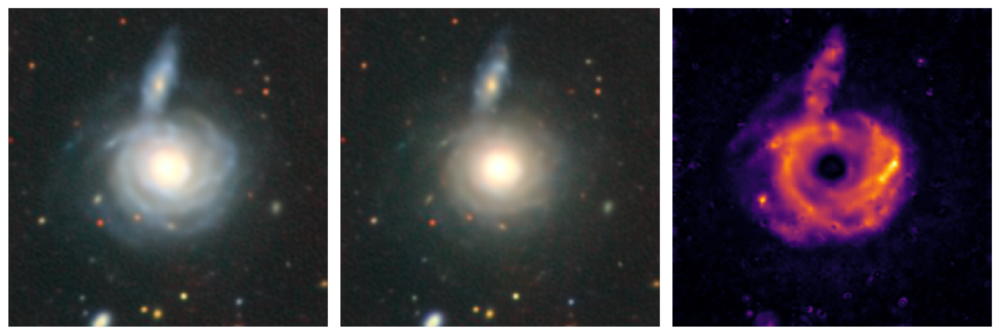

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.020302633..1.0340889].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.039373394..1.0305804].


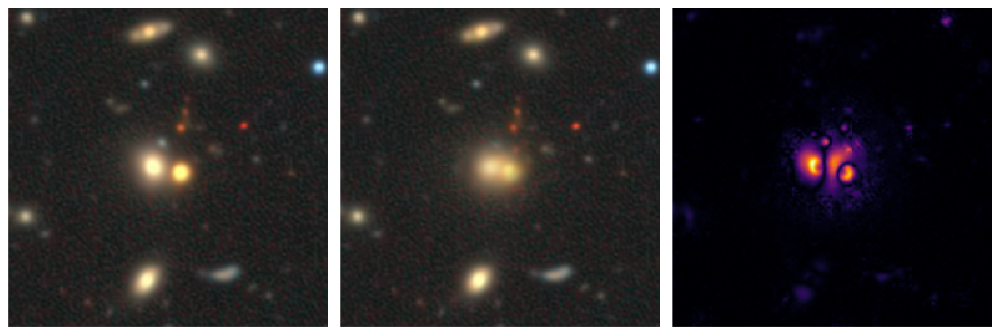

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.036776304..1.0125786].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.039815392..1.025262].


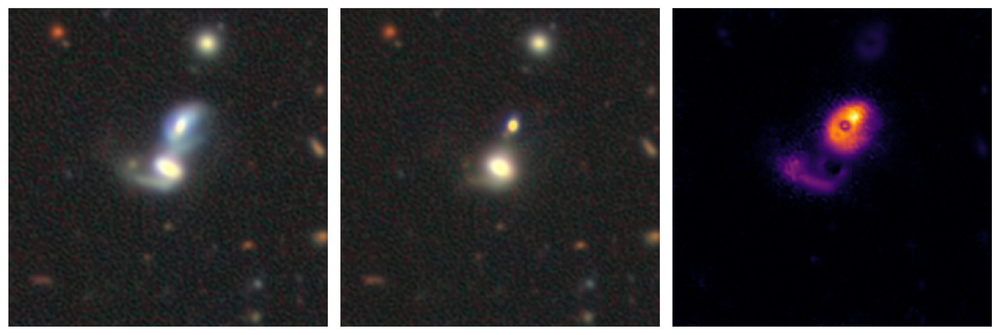

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.045454487..1.0237284].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04346177..1.0266091].


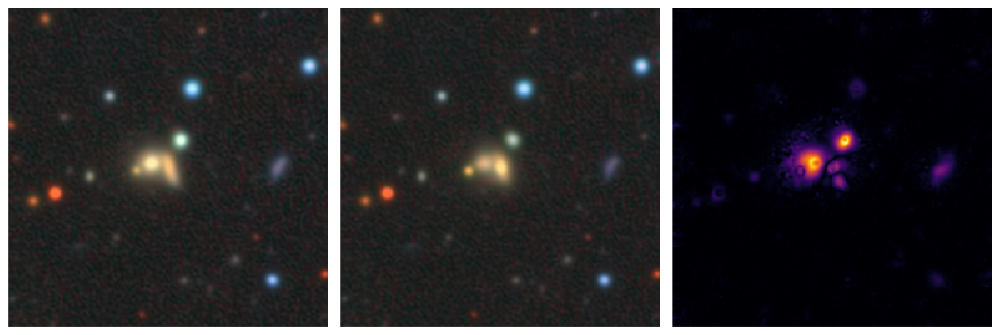

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.036966726..1.0252403].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.039495904..1.0197434].


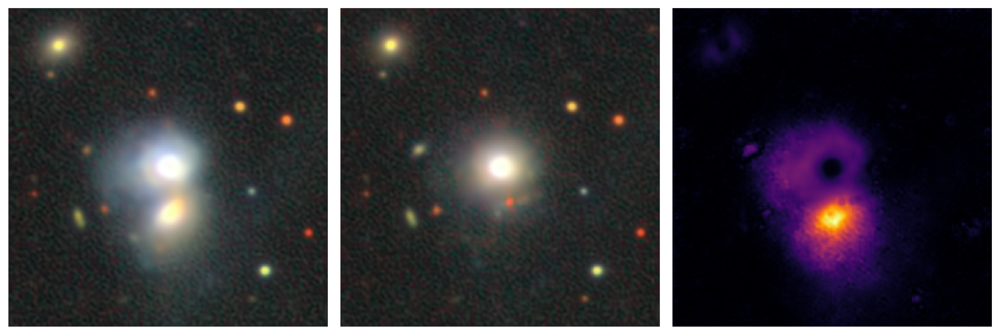

In [8]:
# Removing merging features
# Done
X = batches["X"][batches["label"] == 1]
label = batches["label"][batches["label"] == 1]
style_label = 2 * torch.ones_like(label)

outputs = lightning_loader.predict_step(
    {
        "X": X,
        "label": label,
        "catalog": torch.tensor([], device=device),
        "y": torch.tensor([], device=device),
    }
)
make_uncond_plots()

## Barred spiral

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.015199048..1.0195187].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.026232148..1.021366].


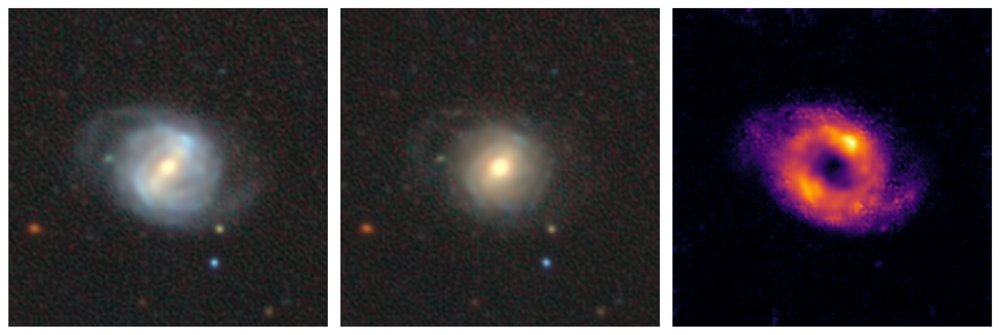

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.036105692..1.0184553].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.044712096..1.0426902].


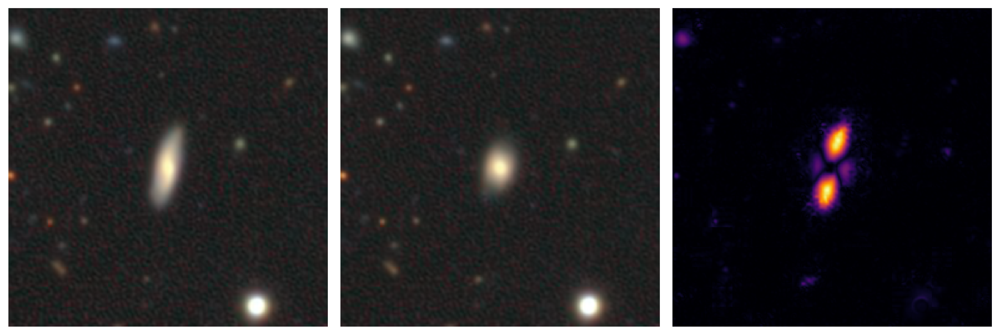

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.011385945..1.024717].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.02143934..1.0213472].


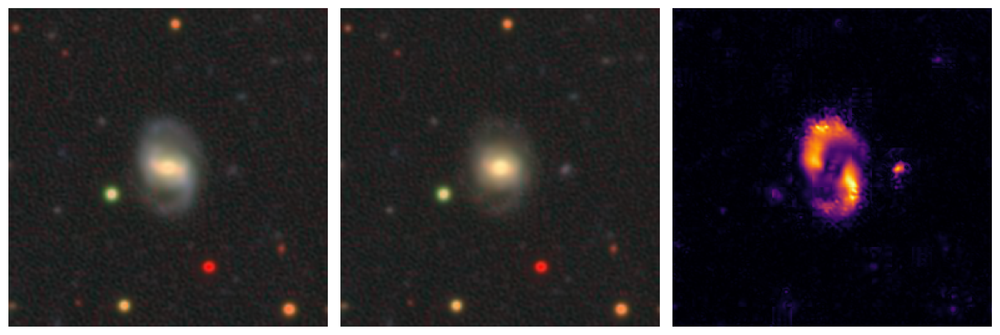

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.05645659..1.0145597].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.057821468..1.0164903].


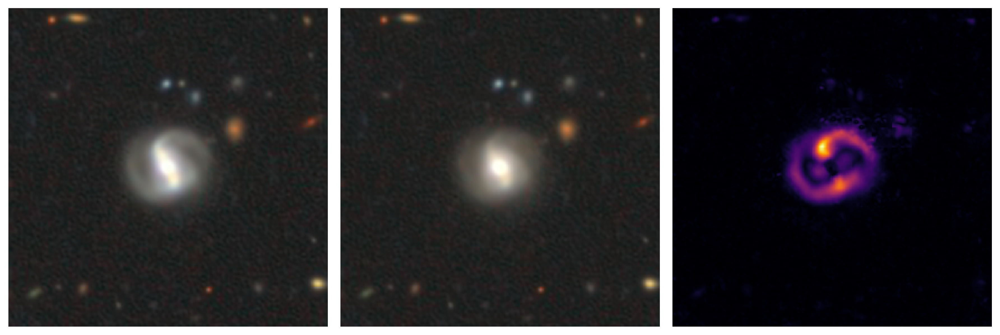

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.041754596..1.032456].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.042320922..1.0170543].


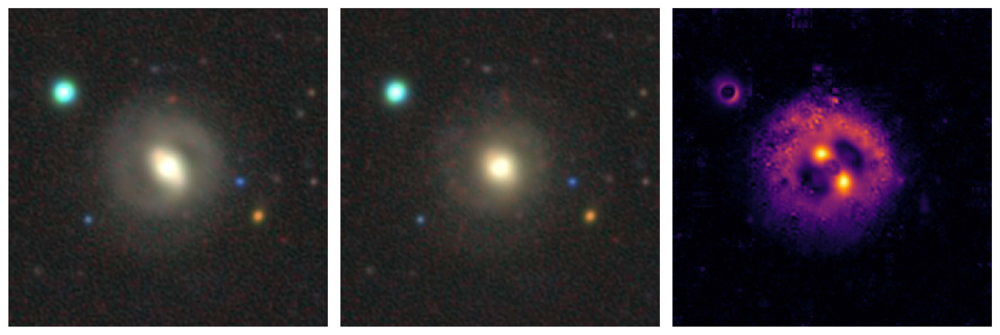

In [9]:
# Remove bar
X = batches["X"][batches["label"] == 5]
label = batches["label"][batches["label"] == 5]
style_label = 2 * torch.ones_like(label)

outputs = lightning_loader.predict_step(
    {
        "X": X,
        "label": label,
        "catalog": torch.tensor([], device=device),
        "y": torch.tensor([], device=device),
    }
)
make_uncond_plots()

## Bulge

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.025832817..1.0147856].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.03247207..1.0305469].


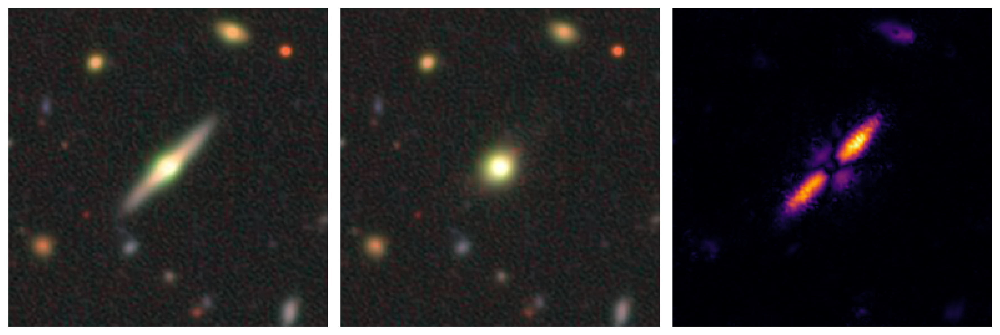

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.048103344..1.0051223].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04685414..1.0121431].


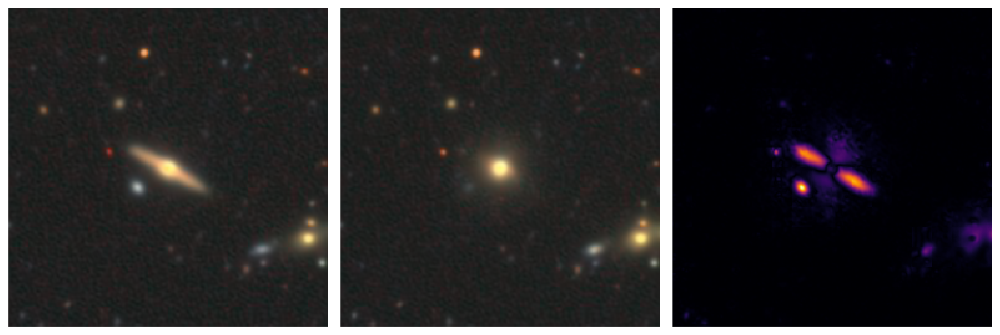

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.030021306..1.0379081].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.034535658..1.0401587].


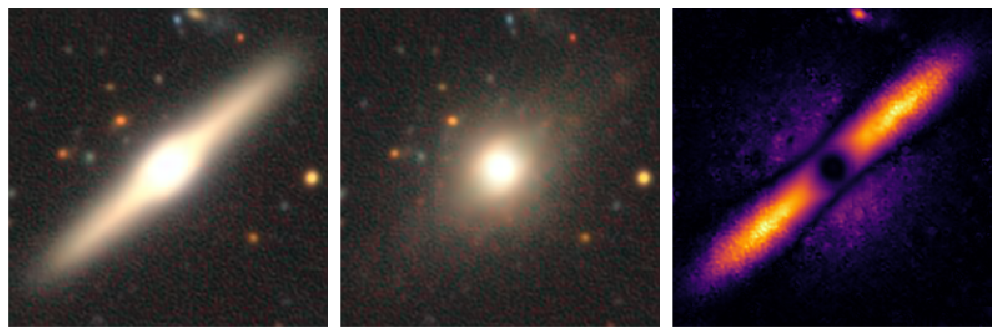

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04211486..1.0793998].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04699748..1.0863324].


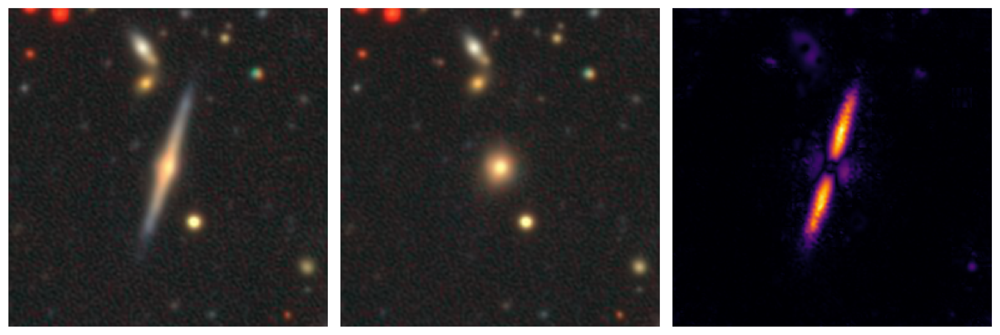

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.035502978..1.0515108].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.03731968..1.0568336].


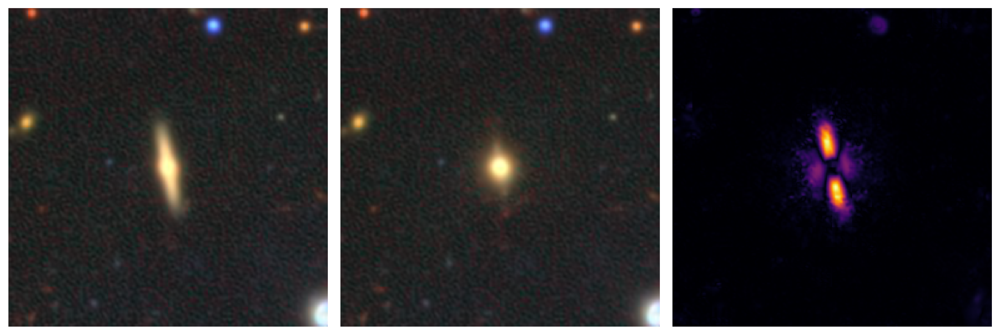

In [10]:
# Edge bulge -> bulgeless
# Unclear
X = batches["X"][batches["label"] == 9]
label = batches["label"][batches["label"] == 9]
style_label = 2 * torch.ones_like(label)

outputs = lightning_loader.predict_step(
    {
        "X": X,
        "label": label,
        "catalog": torch.tensor([], device=device),
        "y": torch.tensor([], device=device),
    }
)
make_uncond_plots()

##  Diffuse structures

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.028744277..1.0121824].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.031420667..1.0091476].


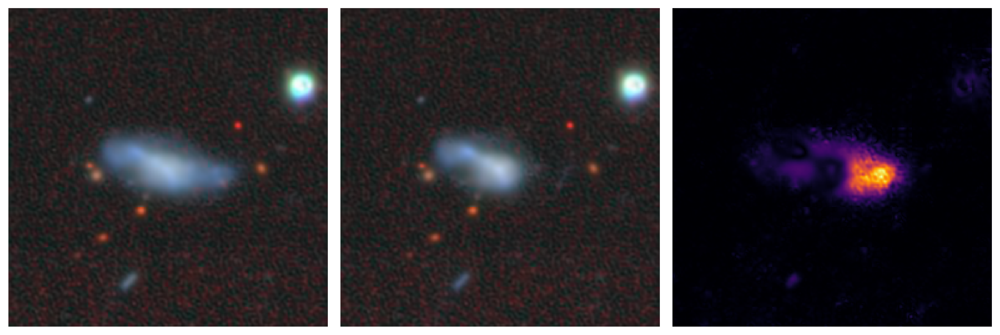

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.051546365..1.010292].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.05045204..1.0040237].


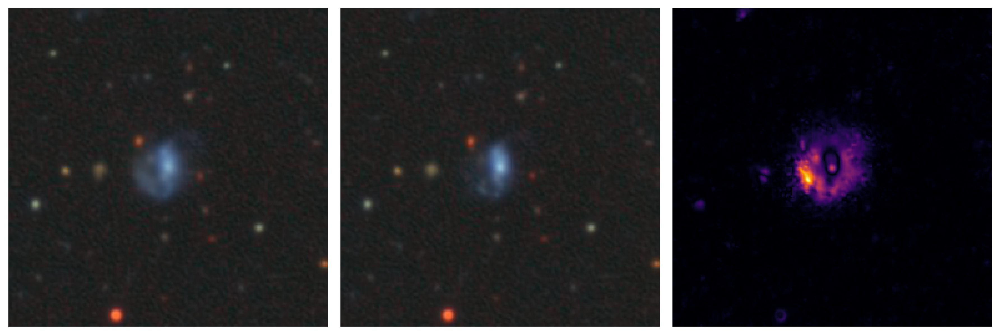

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.03673122..1.0130264].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.042804487..1.0146031].


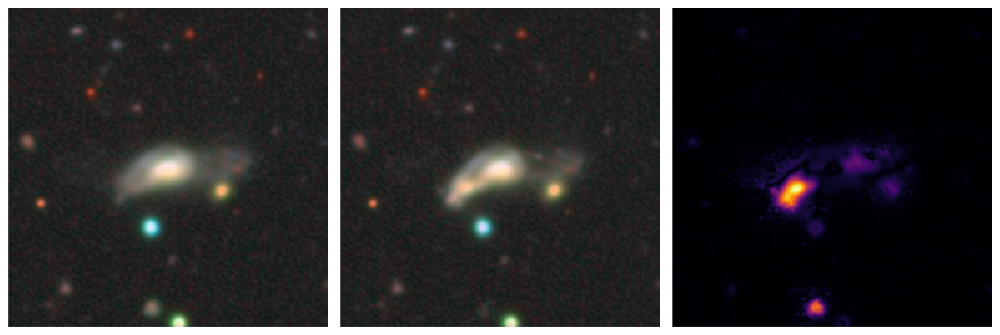

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.057690717..1.0134614].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.05934508..1.0156133].


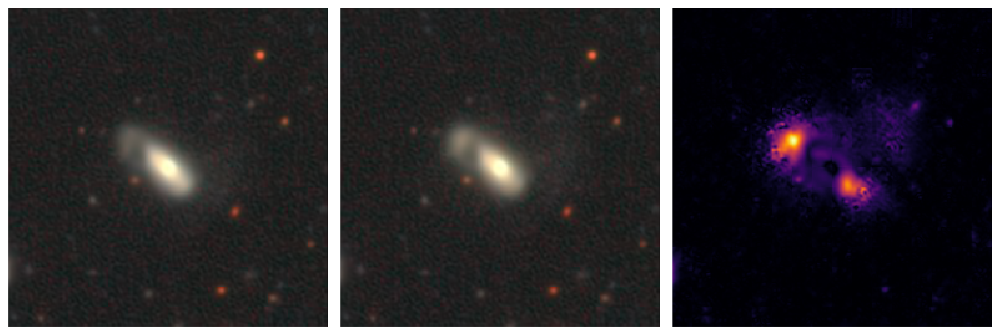

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.025852632..1.0114986].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.027554976..1.0152055].


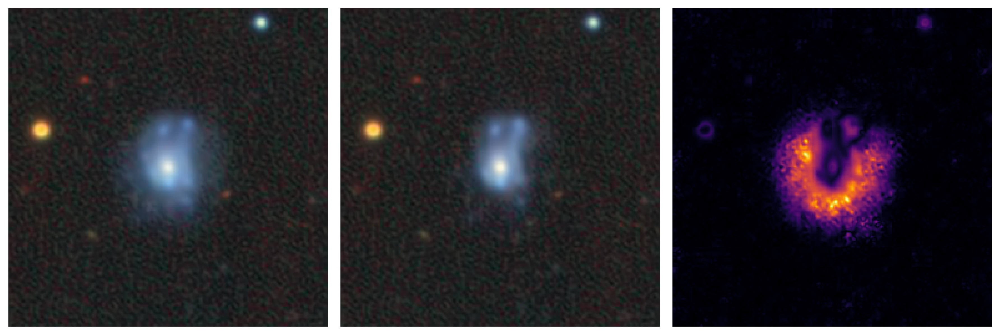

In [11]:
# Capture diffuse structure
# Unclear
X = batches["X"][batches["label"] == 0]
label = batches["label"][batches["label"] == 0]
style_label = torch.ones_like(label)

outputs = lightning_loader.predict_step(
    {
        "X": X,
        "label": label,
        "catalog": torch.tensor([], device=device),
        "y": torch.tensor([], device=device),
    }
)
make_uncond_plots()

##  Edge Buldge

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.025421951..1.0148062].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.032042116..1.0306505].


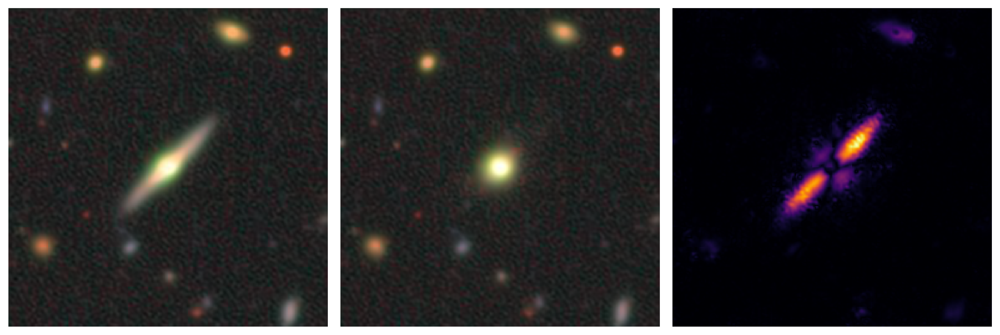

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0482821..1.0051242].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04710131..1.0121208].


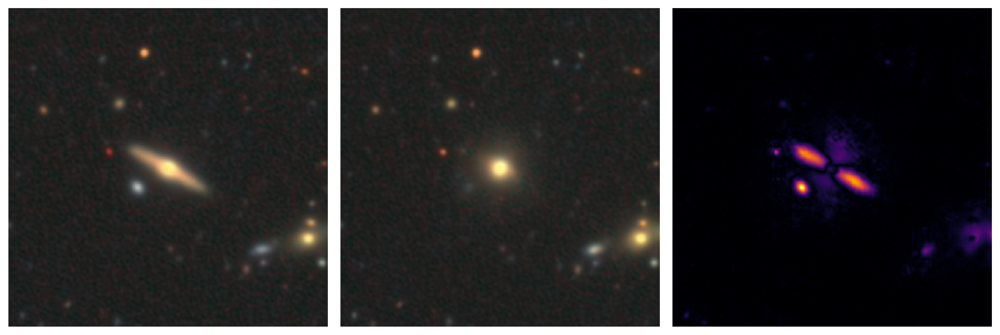

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.029600406..1.0378814].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.034443848..1.0401496].


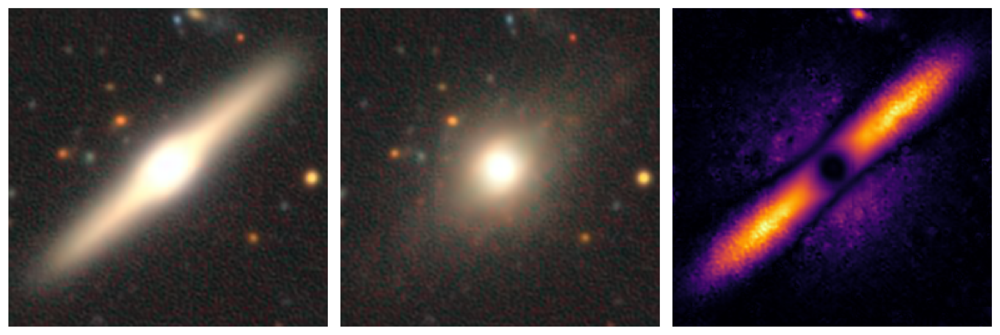

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.042473286..1.0794866].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.047262333..1.0864437].


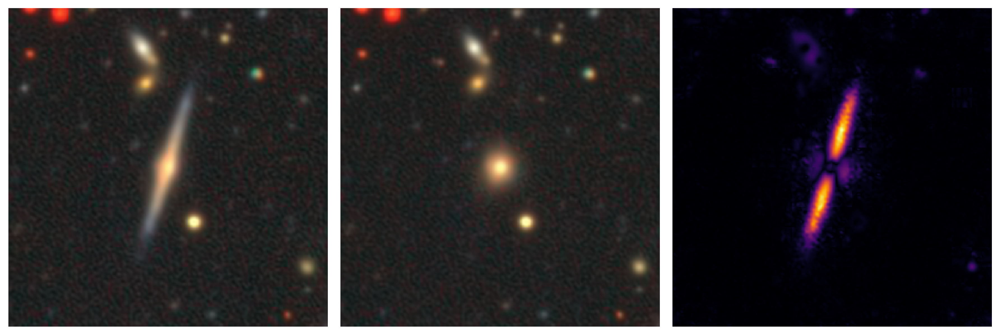

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.035677098..1.0515146].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.03768125..1.0568714].


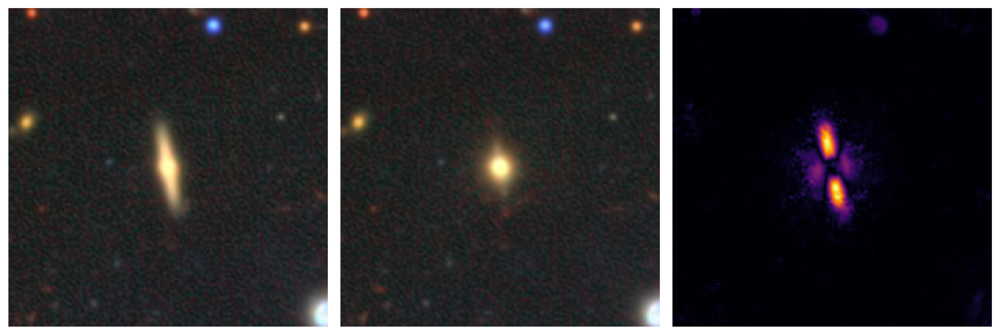

In [12]:
# Edge bulge
X = batches["X"][batches["label"] == 9]
label = batches["label"][batches["label"] == 9]
style_label = 2 * torch.ones_like(label)

outputs = lightning_loader.predict_step(
    {
        "X": X,
        "label": label,
        "catalog": torch.tensor([], device=device),
        "y": torch.tensor([], device=device),
    }
)
make_uncond_plots()

## Tight spiral

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.028788451..1.0191414].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.03526798..1.029428].


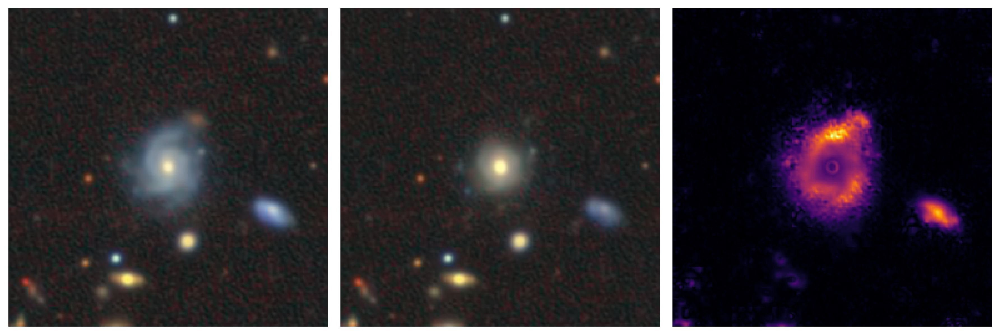

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.019658316..1.0391674].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.025902744..1.0313289].


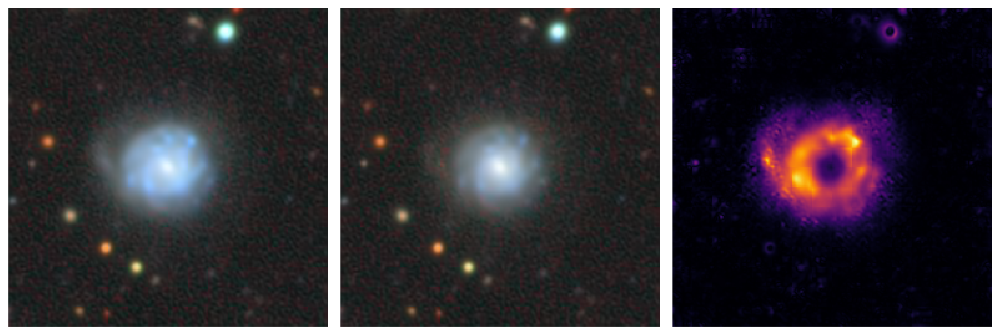

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.044849224..1.0070642].


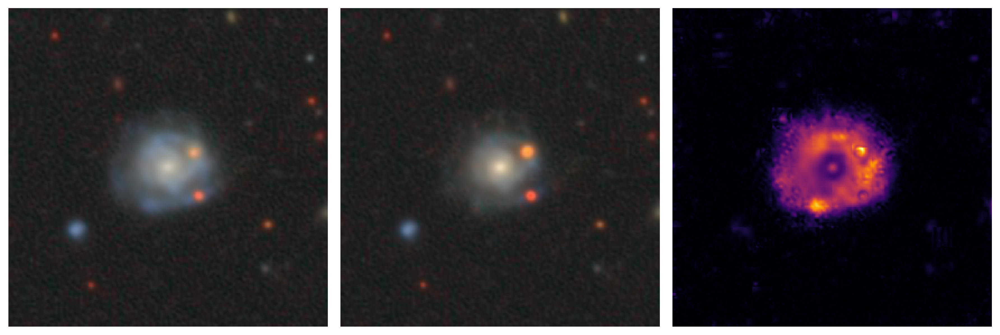

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.03451763..1.0319686].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.041841157..1.0225021].


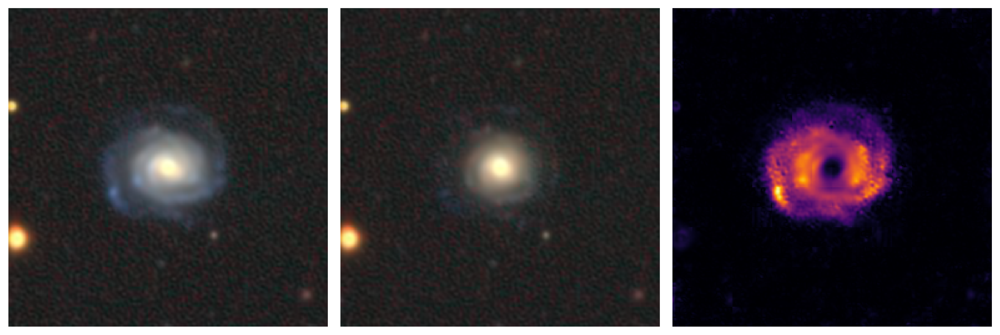

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.028880604..1.0263165].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.03605611..1.0150603].


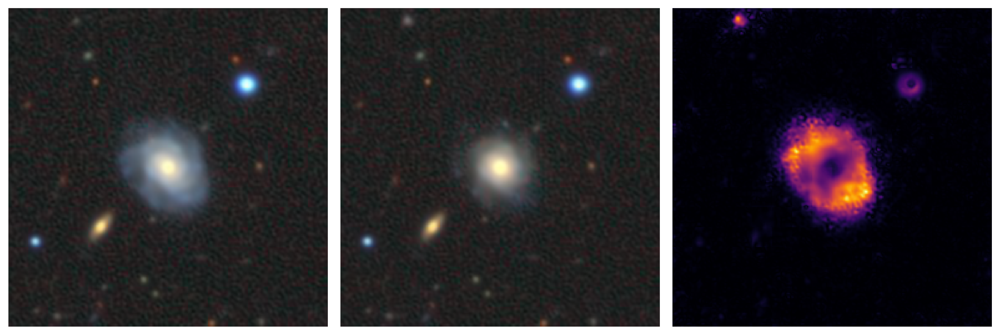

In [13]:
# Removing tight spiral features
# Done
X = batches["X"][batches["label"] == 6]
label = batches["label"][batches["label"] == 6]
style_label = 2 * torch.ones_like(label)

outputs = lightning_loader.predict_step(
    {
        "X": X,
        "label": label,
        "catalog": torch.tensor([], device=device),
        "y": torch.tensor([], device=device),
    }
)
make_uncond_plots()

## Loose spiral

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.029038515..1.0249621].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.010922896..1.0289551].


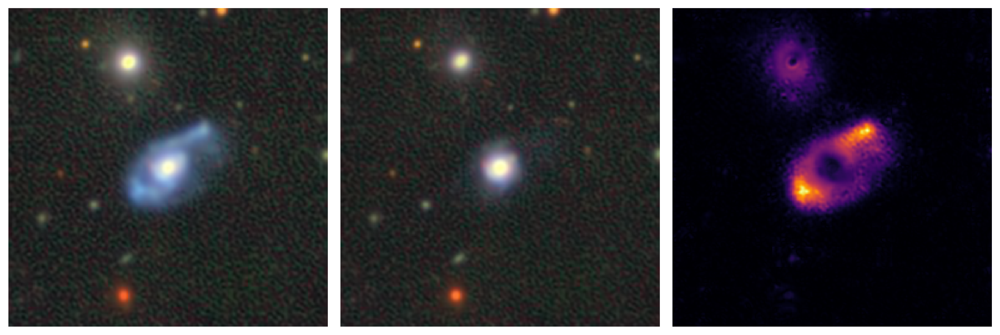

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.048944727..1.028184].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.052073114..1.0397751].


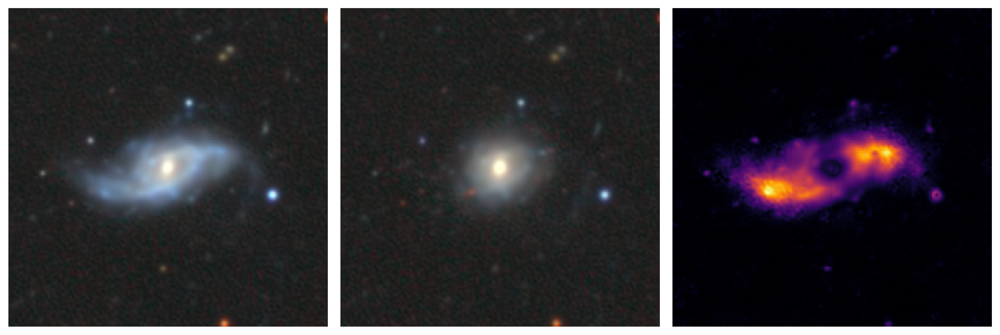

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.039389677..1.0070046].


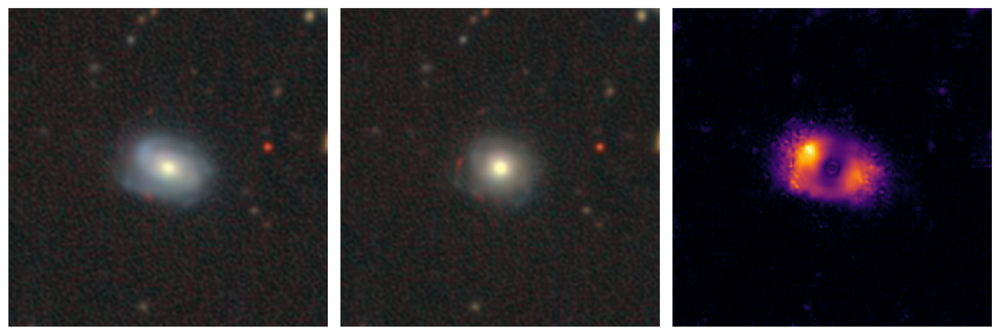

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.029824462..1.000883].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0064386..1.050133].


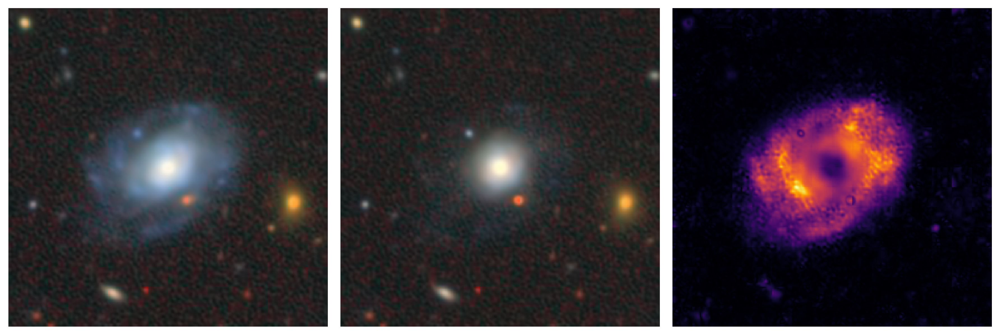

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.034374505..1.0108273].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.034900535..1.0050569].


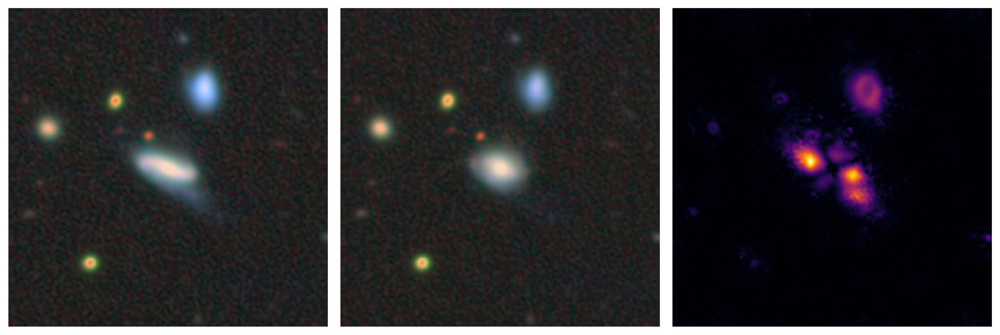

In [14]:
# Removing loose spiral features
# Done
X = batches["X"][batches["label"] == 7]
label = batches["label"][batches["label"] == 7]
style_label = 2 * torch.ones_like(label)

outputs = lightning_loader.predict_step(
    {
        "X": X,
        "label": label,
        "catalog": torch.tensor([], device=device),
        "y": torch.tensor([], device=device),
    }
)
make_uncond_plots()